# IMPORTING LIBRARIES

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# LOADING THE DATASET.

In [ ]:
data= pd.read_csv("/content/Walmart.csv")

In [ ]:
data

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


# EXPLORING THE DATASET.

In [ ]:
data.shape

(6435, 8)

In [ ]:
#Checking for null values
data.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [ ]:
#Checking for duplicates
data.duplicated().sum()

0

In [ ]:
#Describing the data.
data.describe().astype(int)

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435,6435,6435,6435,6435,6435,6435
mean,23,1046964,0,60,3,171,7
std,12,564366,0,18,0,39,1
min,1,209986,0,-2,2,126,3
25%,12,553350,0,47,2,131,6
50%,23,960746,0,62,3,182,7
75%,34,1420158,0,74,3,212,8
max,45,3818686,1,100,4,227,14


In [ ]:
#Information about the data.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [ ]:
#number of stores
data['Store'].nunique()

45

In [ ]:
# number of weeks for which data is present.
data['Date'].nunique()

143

In [ ]:
 #number of months for which the data is present
data['Date'].apply(lambda x :x.split('-')[1]+'-'+x.split('-')[2]).nunique()

33

#CHECKING DISTRIBUTION FOR VARIOUS NUMERICAL COLUMNS.

In [ ]:
a= data.drop(columns=['Store','Date'])

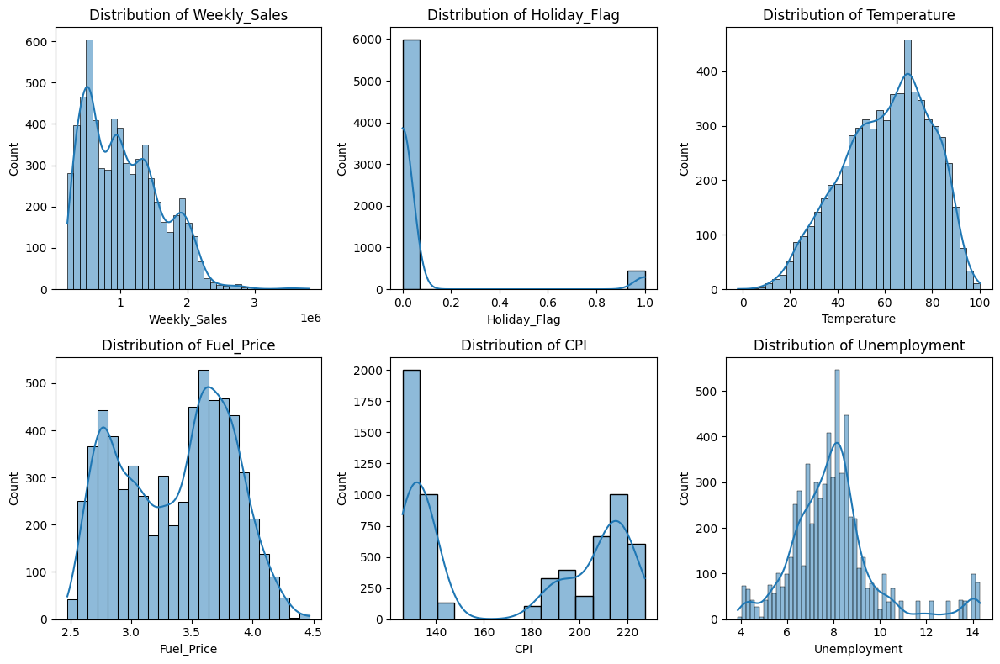

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for i, ax in enumerate(axes.flatten()):
    if i < len(a.columns):
        sns.histplot(data=a, x=a.columns[i],kde= True, ax=ax)
        ax.set_title(f'Distribution of {a.columns[i]}')


plt.tight_layout()

plt.show()

#DATA VISLALIZATION.

In [ ]:
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


### CORRELATION OF VARIOUS NUMRICAL COLUMNS AMONG EACH OTHERS.

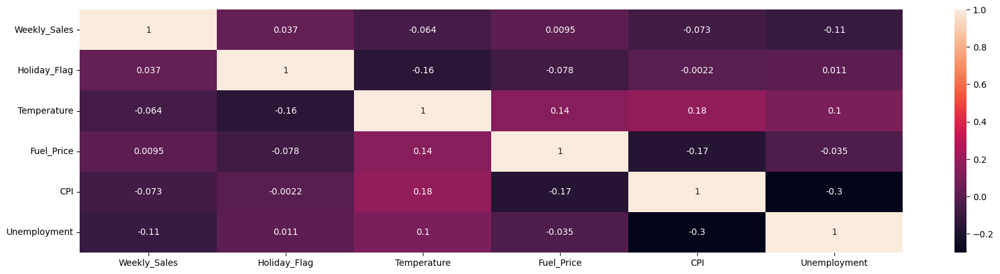

In [ ]:
df1=data.drop(columns=['Store','Date'])
sns.heatmap(df1.corr(),annot=True)
plt.show()

### TOTAL SALES PER STORE.

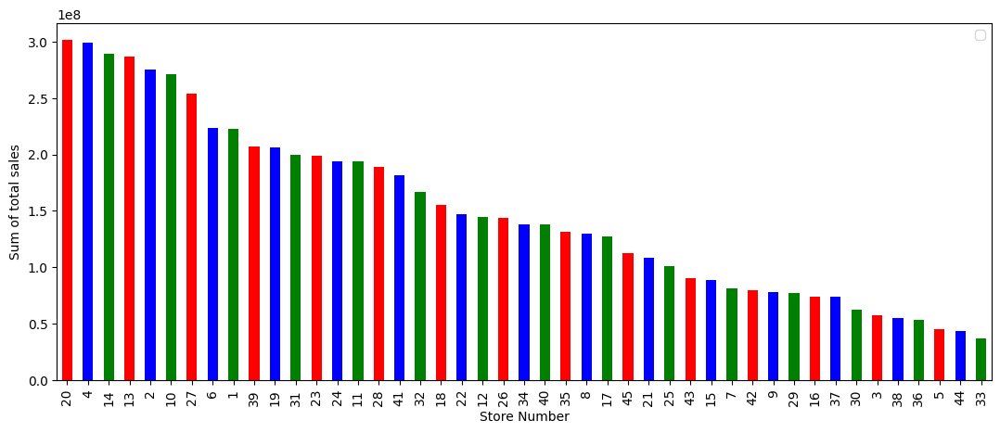

In [ ]:

sum= pd.DataFrame(data.groupby('Store')['Weekly_Sales'].sum()).reset_index()
sum=sum.sort_values('Weekly_Sales', ascending= False)

plt.rcParams['figure.figsize'] = (13,5)
sum.plot.bar(x='Store', y='Weekly_Sales', color=['red','blue','green'], label='')
plt.xlabel('Store Number')
plt.ylabel('Sum of total sales')
plt.legend(loc='best')
plt.show()


In [ ]:
#DIFFERENCE BETWEEN OVERALL MAXIMUM AND MINIMUM SALES.
(data[data['Store']==20]['Weekly_Sales'].sum())-(data[data['Store']==33]['Weekly_Sales'].sum())

264237570.50000006

In [ ]:
# AVERAGE SALES PER STORE , YEAR WISE.

data['Year']=pd.to_datetime(data['Date']).dt.year
data.head()

<ipython-input-91-edf712a9d3e3>:3: UserWarning:

Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.



,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106,2010
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106,2010
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106,2010
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106,2010
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106,2010


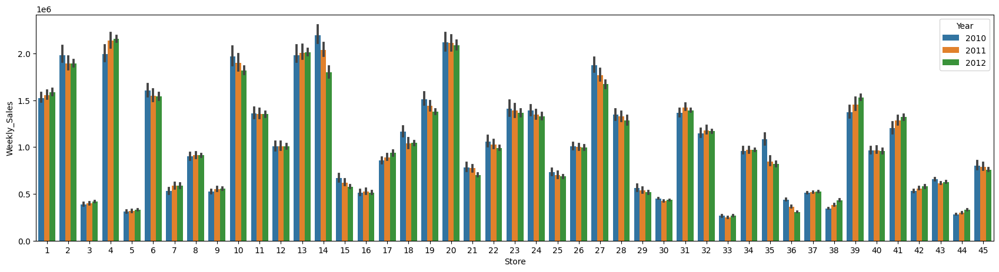

In [ ]:
#year wise average sales of each store.

plt.rcParams['figure.figsize'] = (21,5)
sns.barplot(x='Store',y='Weekly_Sales',hue='Year', data=data)
plt.show()

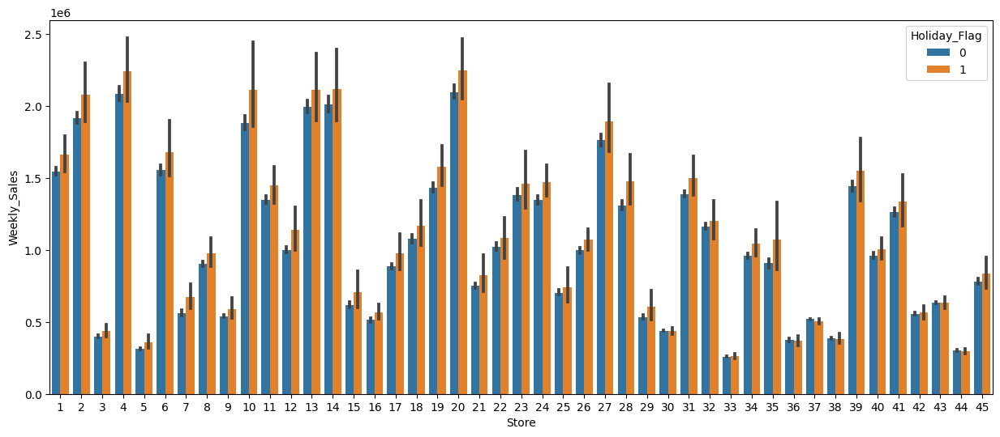

In [ ]:
#AVERAGE SALES OF STORES , WITH RESPECT TO  HOLIDAY OR NOT.

plt.figure(figsize=(15,6))
sns.barplot(x='Store', y='Weekly_Sales', hue='Holiday_Flag', data=data)
plt.show()

### EFFECT OF TEMPERATURE ON  WEEKLY SALES.

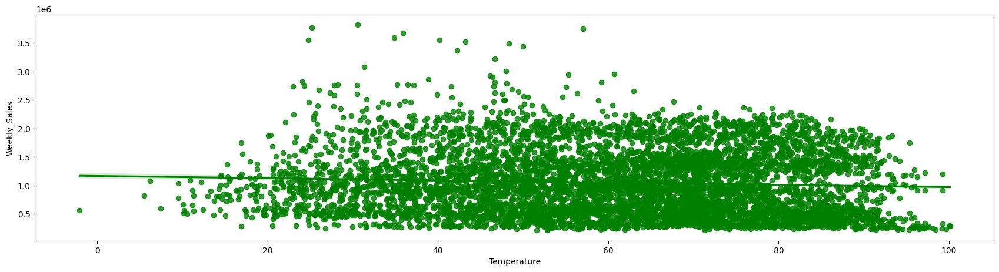

In [ ]:
sns.regplot(x='Temperature',y='Weekly_Sales', data=data,color='green')
plt.show()

In [ ]:
# VISUALIZING THE EFFECT OF TEMPERATURE ON SALES  AFTER DIVIDING TEMPERATURE ON A GROUP PF 20-20 AND  CHECKING THE FOOTFALL FOR EACH CATEGORY.
def temp(input):
    if(input>=0 and input<=21):
     return('other')
    elif(input>=20 and input<=41):
      return('20-40')
    elif(input>=40 and input<=61):
      return('40-60')
    elif(input>=60 and input<=81):
      return('60-80')
    elif(input>=80 and input<=101):
      return('80-100')
    else:
      return('other')

In [ ]:
df1= data.copy()

In [ ]:
df1['Temp_dist.']=data['Temperature'].apply(temp)

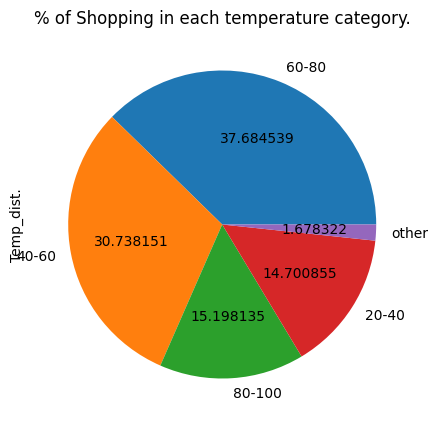

In [ ]:

df1['Temp_dist.'].value_counts().plot(kind='pie',autopct='%2f')
plt.title("% of Shopping in each temperature category.")
plt.show()

In [ ]:
#Most of the shopping was done when temperature was between 60-80.

### EFFECT OF FUEL PRICES ON WEEKLY SALES.

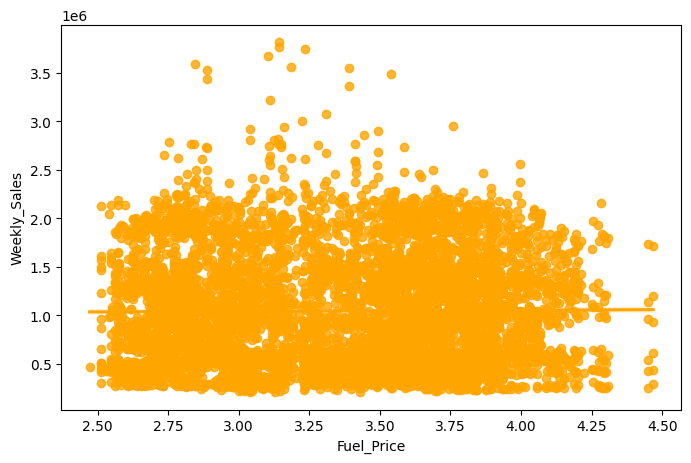

In [ ]:


plt.figure(figsize=(8,5))
sns.regplot(x='Fuel_Price',y='Weekly_Sales', data=data,color='orange')
plt.show()

In [ ]:
#there is no such impace of fuel_prices on weekly_sales ,  on contrary there is very slight increase in weekly sales with
#increase in fuel prices.

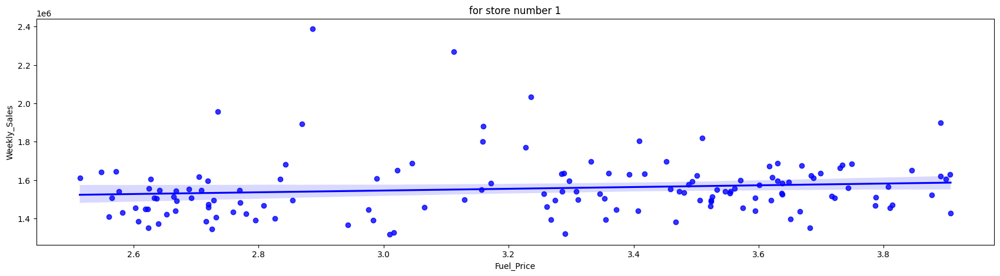

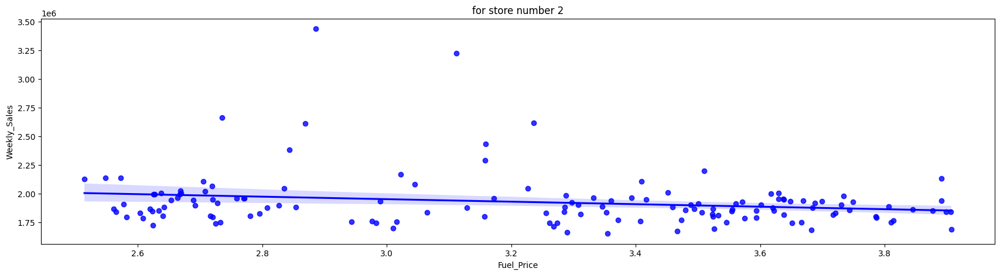

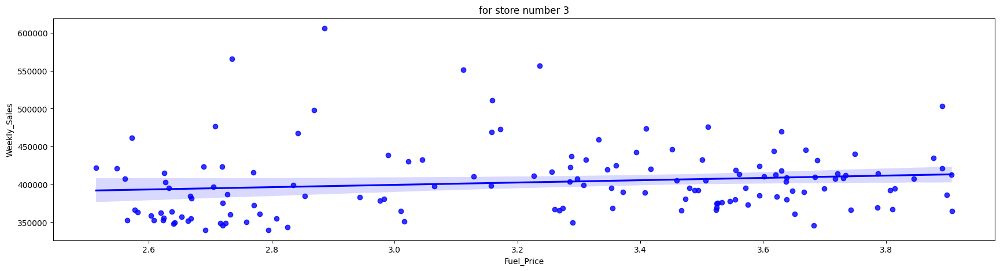

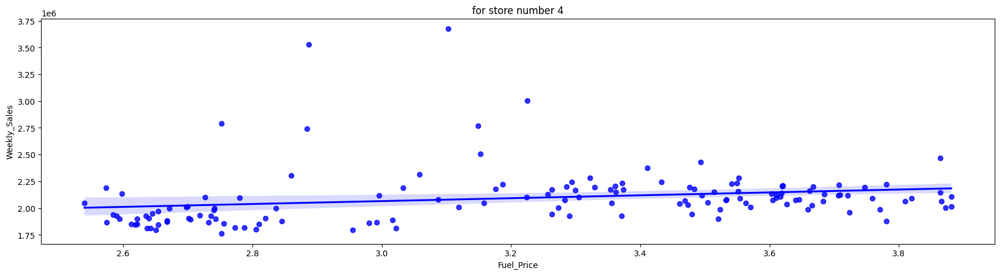

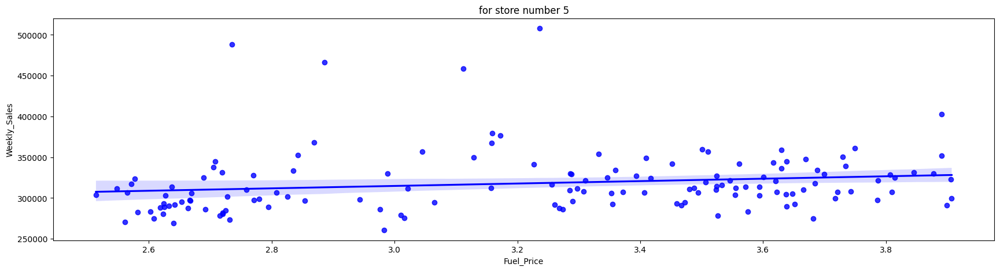

...

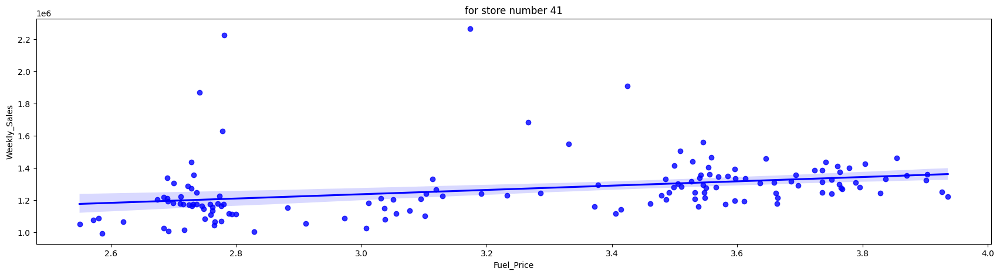

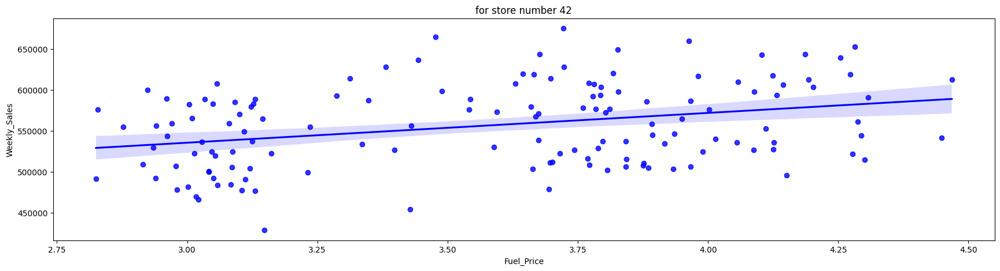

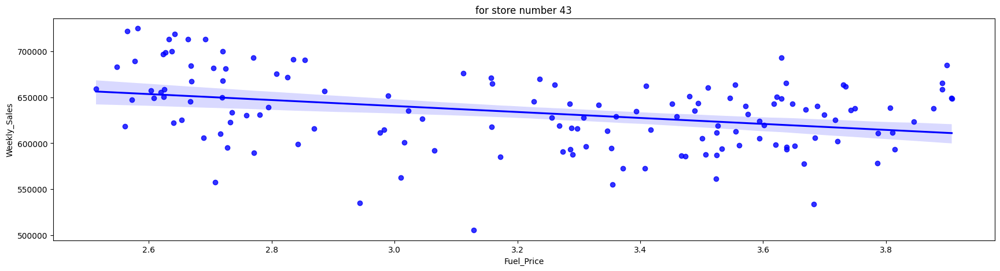

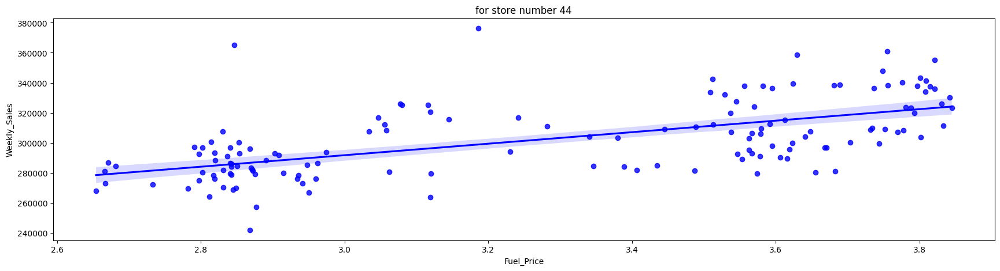

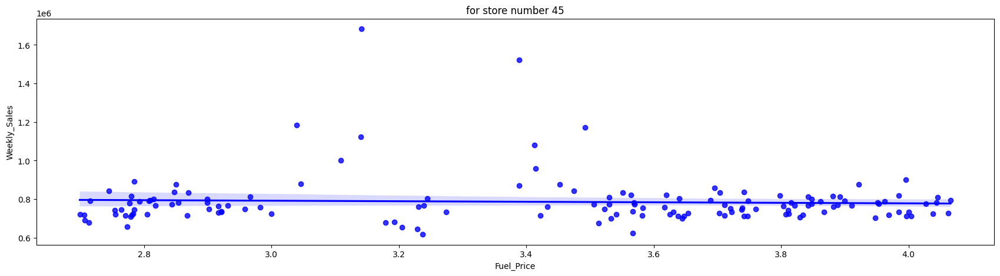

In [ ]:
#Effect of FuelPrice for each  store
for i in range(1,46):
  df=data[data['Store']==i]
  sns.regplot(x='Fuel_Price',y='Weekly_Sales',data=df,color='b')
  plt.title(f'for store number {i}')
  plt.show()

### EFFECT OF CPI ON WEEKLY SALES.

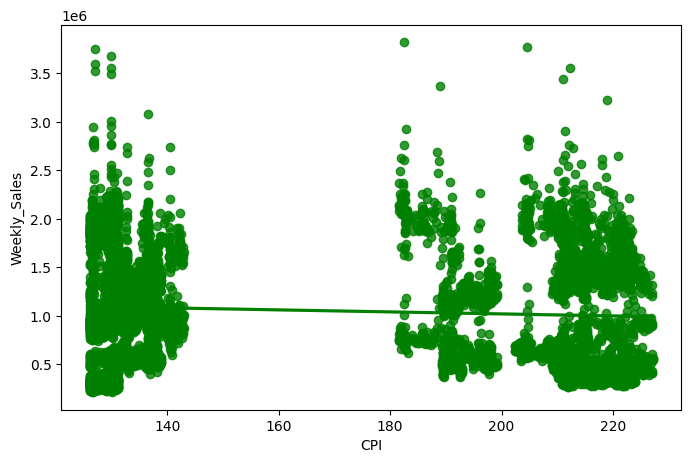

In [ ]:
plt.figure(figsize=(8,5))
sns.regplot(x='CPI',y= 'Weekly_Sales', data=data,color='green')
plt.show()

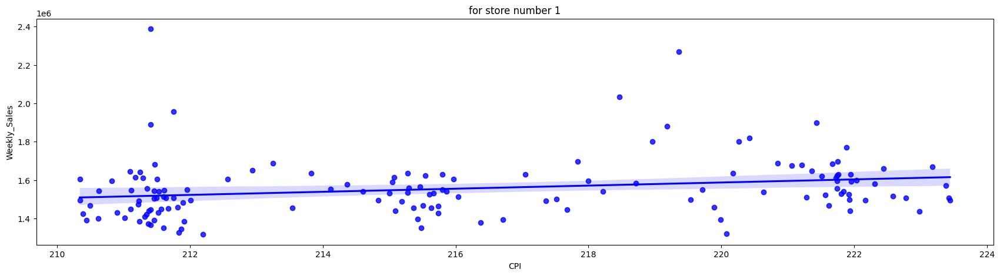

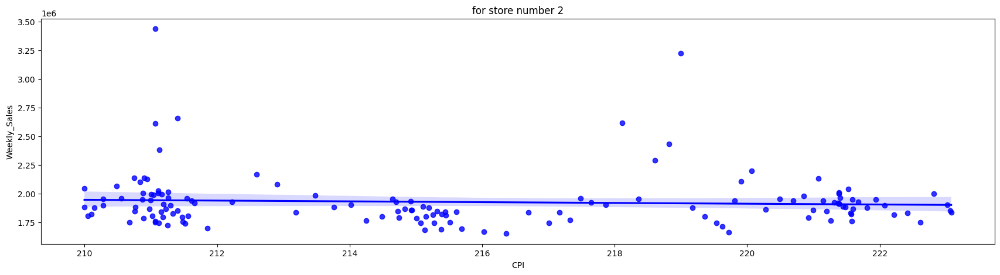

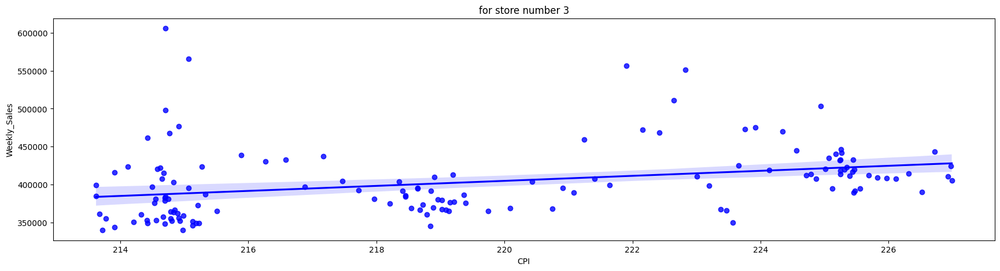

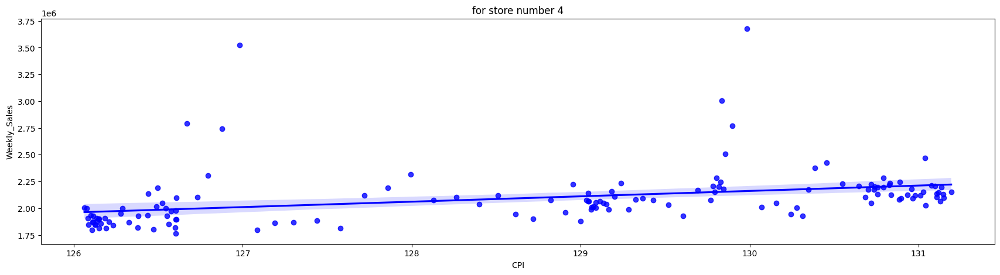

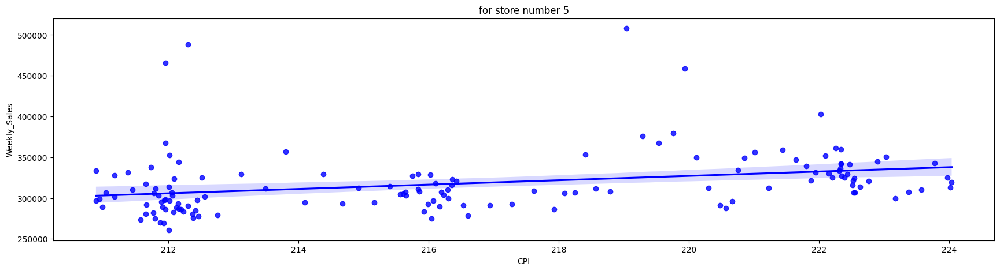

...

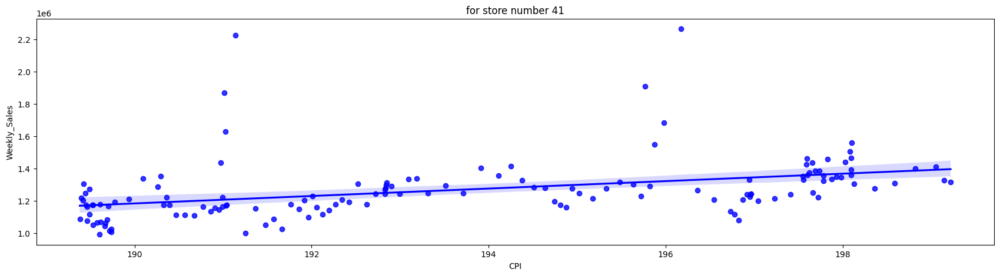

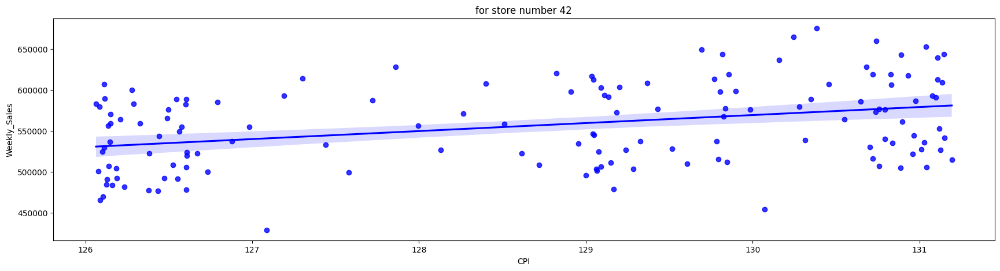

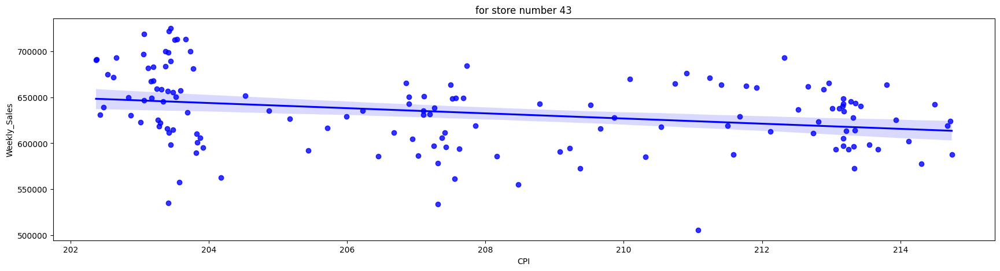

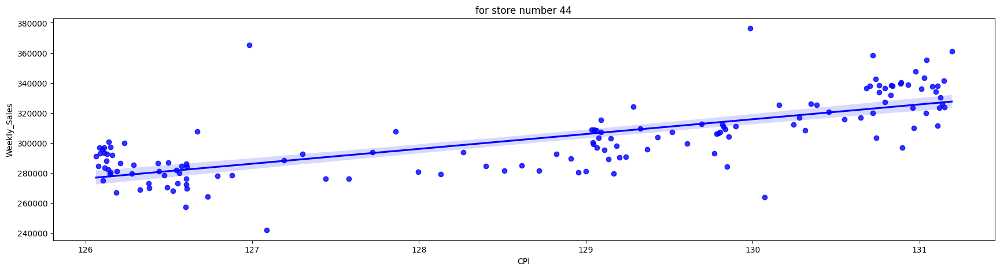

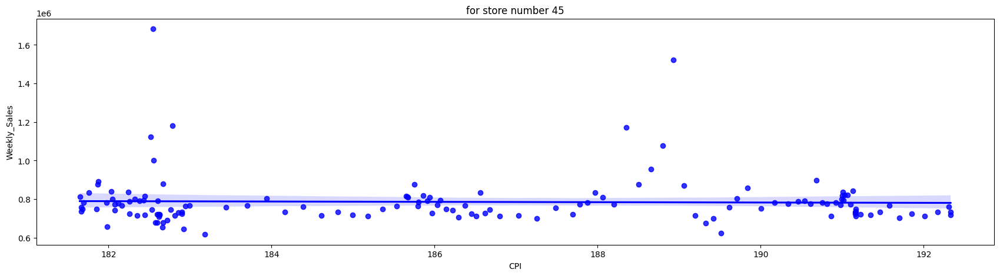

In [ ]:
#Effect of CPI on various stores.
for i in range(1,46):
  df=data[data['Store']==i]
  sns.regplot(x='CPI',y='Weekly_Sales',data=df,color='b')
  plt.title(f'for store number {i}')
  plt.show()

### EFFECT OF UNEMPLOYMENT ON WEEKLY SALES.

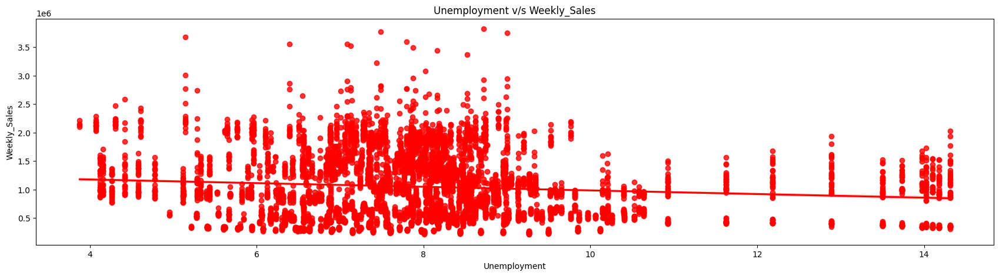

In [ ]:

sns.regplot(x='Unemployment', y='Weekly_Sales', data=data,color='red')
plt.title('Unemployment v/s Weekly_Sales')
plt.show()

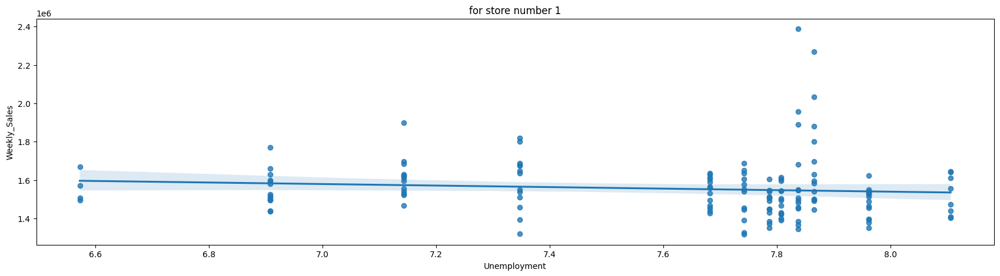

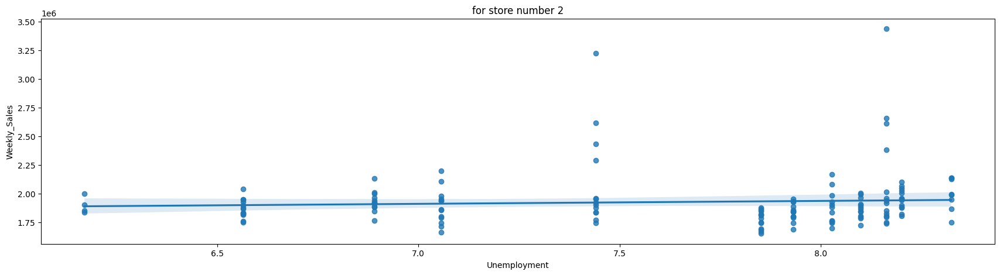

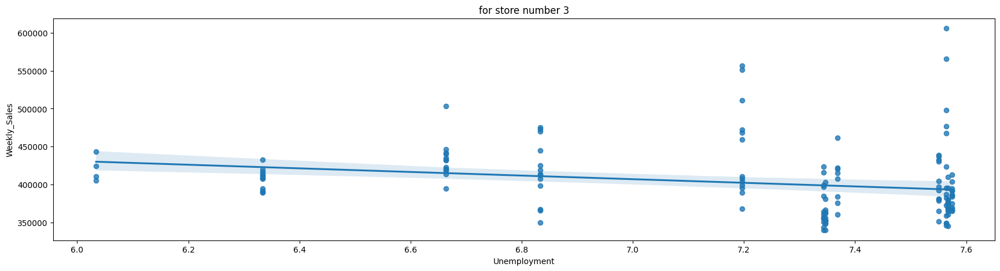

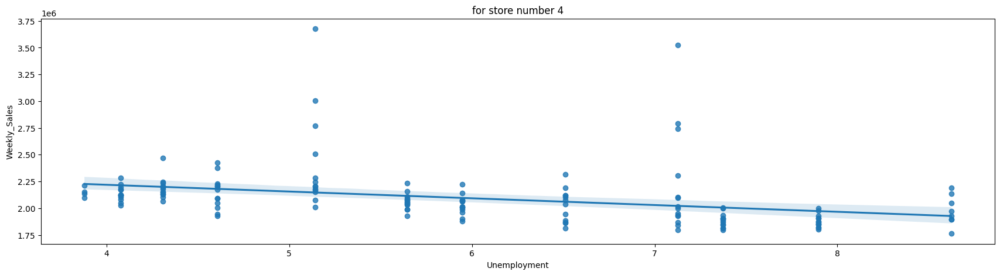

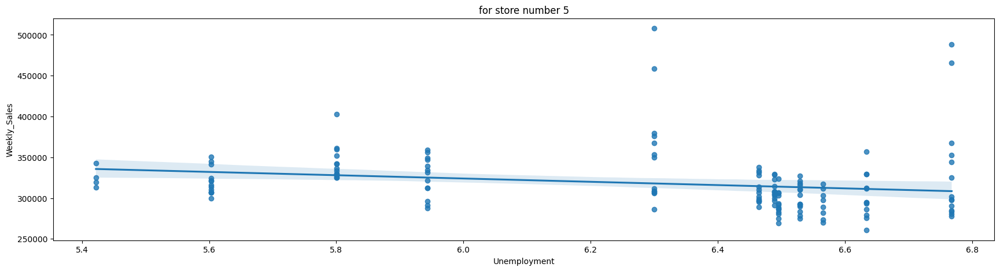

...

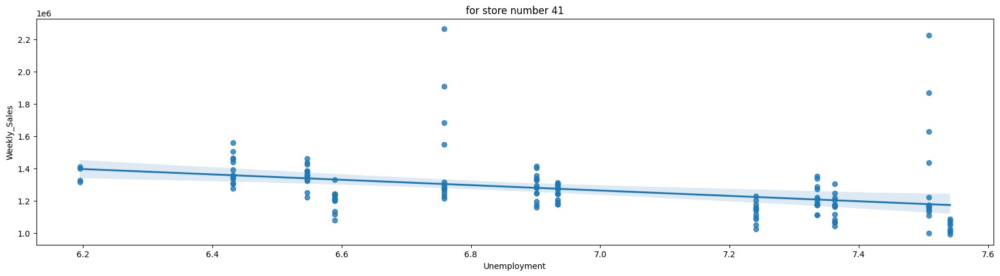

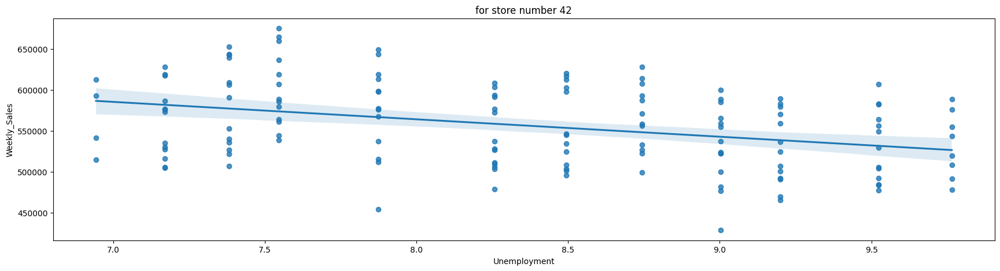

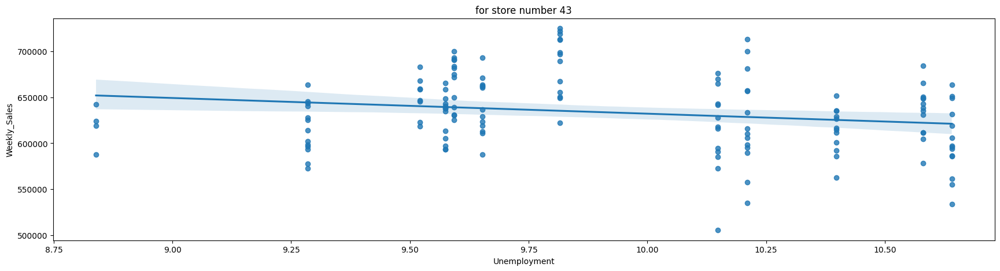

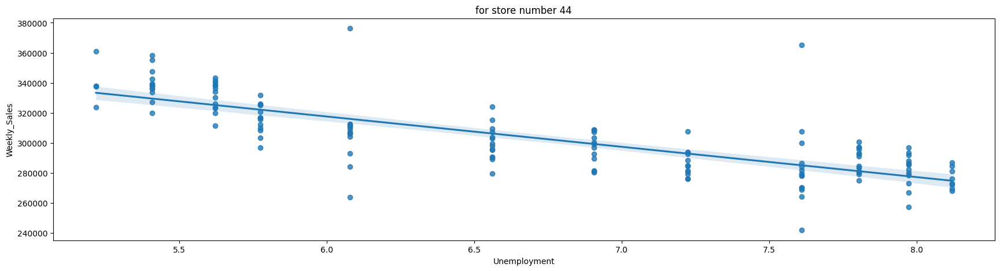

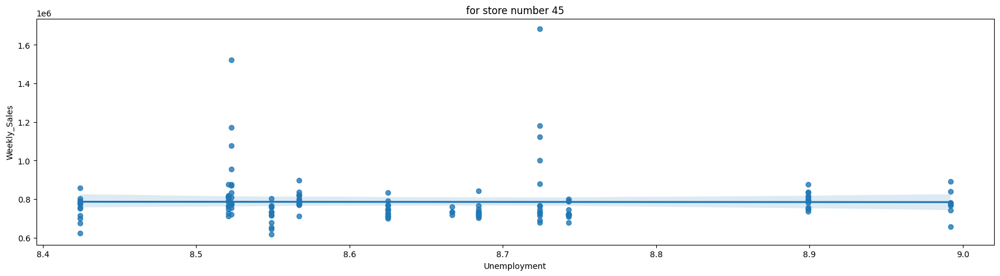

In [ ]:
#Effect of unemploynment for each  store

for i in range(1,46):
  df=data[data['Store']==i]
  sns.regplot(x='Unemployment',y='Weekly_Sales',data=df)
  plt.title(f'for store number {i}')
  plt.show()

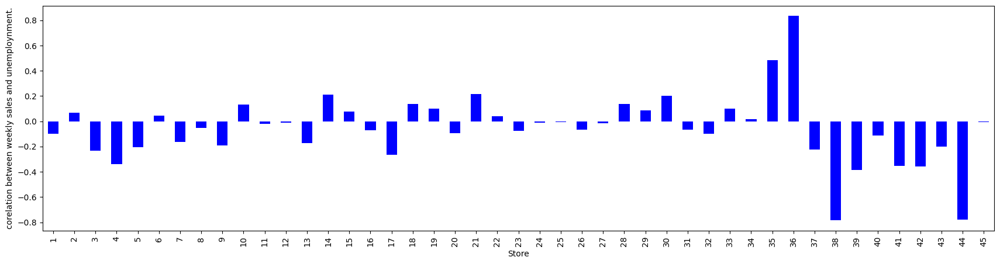

In [ ]:
#WORST EFFCTED STORE BY UNEMPLOYNMENT RATIO.

grouped= data.groupby('Store')
grouped.apply(lambda group: group['Unemployment'].corr(group['Weekly_Sales'])).plot(kind='bar', color='b')
plt.ylabel('corelation between weekly sales and unemploynment.')
plt.show()

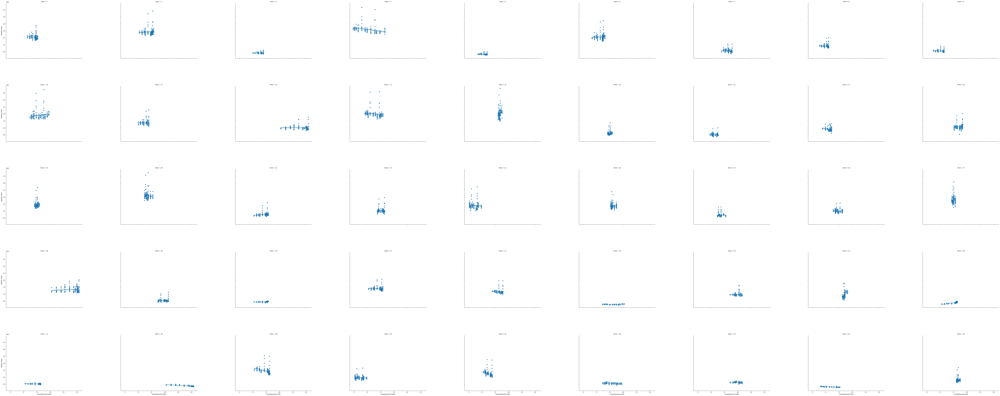

In [ ]:
#Effect of unemploynment on sales at a glance

g= sns.FacetGrid(data, col='Store', col_wrap=9, height=8, aspect=1.4)
g.map(sns.regplot,"Unemployment", "Weekly_Sales")
g.set_axis_labels("Unemployment Rate", "Weekly Sales")
g.fig.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()


### BETTER SALES ON HOLIDAYS OR WORKING DAYS

In [ ]:
df1=pd.DataFrame(data['Holiday_Flag'].value_counts())
df1['Sales']=data.groupby('Holiday_Flag')['Weekly_Sales'].sum()
df1

,Holiday_Flag,Sales
0,5985,6.231919e+09
1,450,5.052996e+08


In [ ]:
a=pd.DataFrame(df1['Sales']/df1['Holiday_Flag'], columns=['Average_sales'])
a=pd.DataFrame(a['Average_sales'].astype(int))
a

,Average_sales
0,1041256
1,1122887


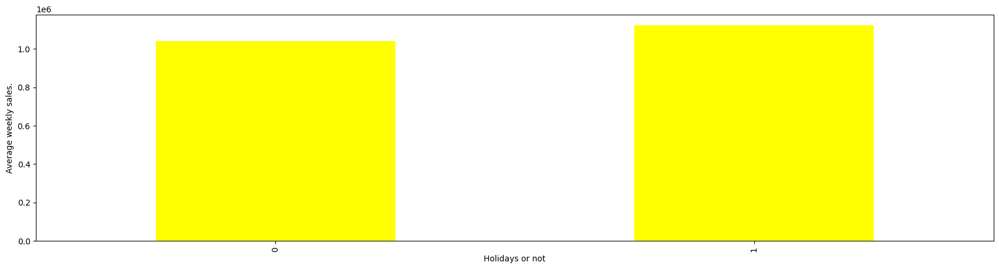

In [ ]:
a['Average_sales'].plot(kind='bar',color='yellow')
plt.xlabel('Holidays or not')
plt.ylabel('Average weekly sales.')
plt.show()

In [ ]:
((1122888.0-1041256.30)/1041256.30)*100

7.8397316779739965

# SEASONAL DECOMPOSITION OF THE DATA.

### SEASONAL DECOMPOSE  FOR ENTIRE DATASET.

In [ ]:
import plotly.express as px



Seasonal Decomposition for Overall sales per week.


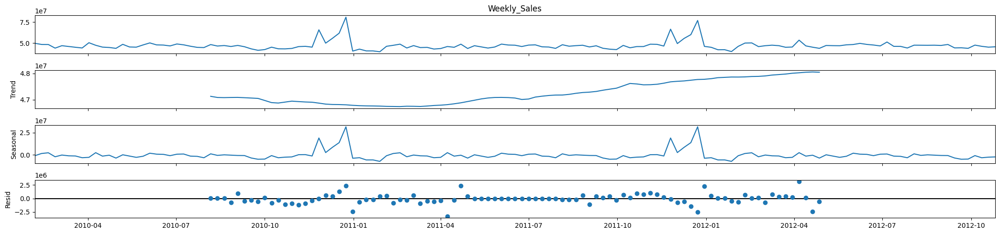

In [ ]:
df1= data[['Date','Weekly_Sales']]
df1=pd.DataFrame(df1.groupby('Date')['Weekly_Sales'].sum().reset_index())
df2=df1.copy()
df2.columns=['ds','y']
df2['ds']=pd.to_datetime(df2['ds'],dayfirst=True)
df2= df2.sort_values(by='ds')
fig=px.line(df2, x="ds", y="y", title="Curve for Sum of Overall sales Per week.")
fig.show()

print('')
print('')
print("Seasonal Decomposition for Overall sales per week.")
df1['Date']=pd.to_datetime(df1['Date'],dayfirst=True)
df1= df1.sort_values(by='Date')
df1= df1.set_index(['Date'])
from statsmodels.tsa.seasonal import seasonal_decompose
decompose_result = seasonal_decompose(df1['Weekly_Sales'].dropna())
decompose_result.plot();
plt.show()

In [ ]:
data

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106,2010
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106,2010
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106,2010
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106,2010
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106,2010
...,...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684,2012
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667,2012
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667,2012
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667,2012


### SEASONAL DECOMPOSE  FOR EACH STORE.



Seasonal Decomposition for Overall sales per week for store number1


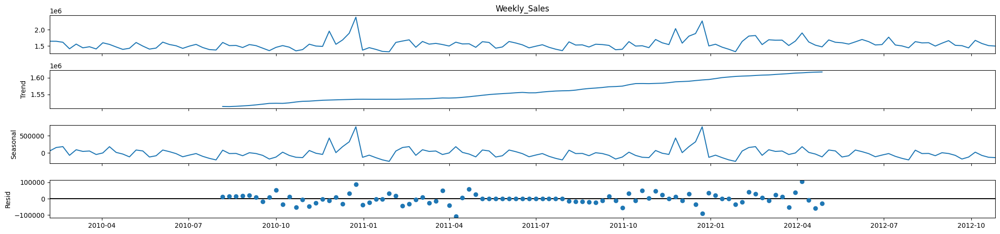



Seasonal Decomposition for Overall sales per week for store number2


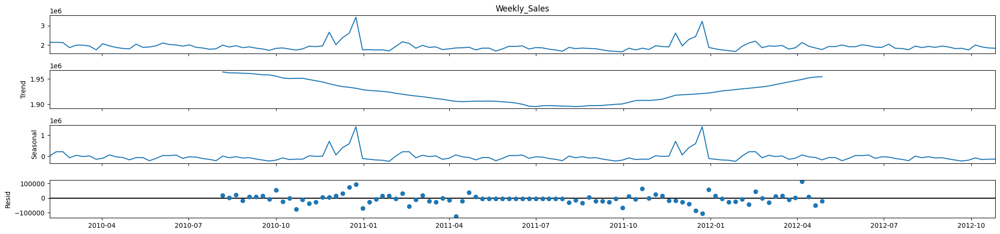



Seasonal Decomposition for Overall sales per week for store number3


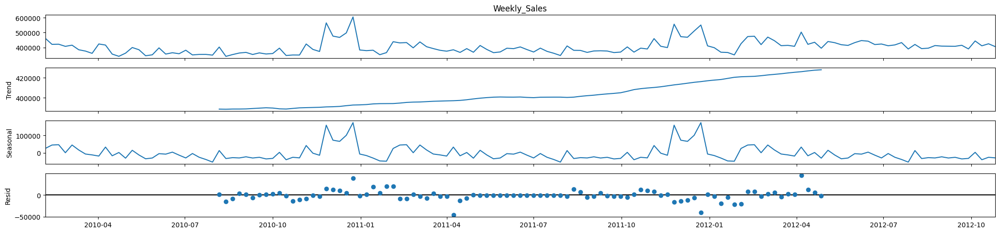



Seasonal Decomposition for Overall sales per week for store number4


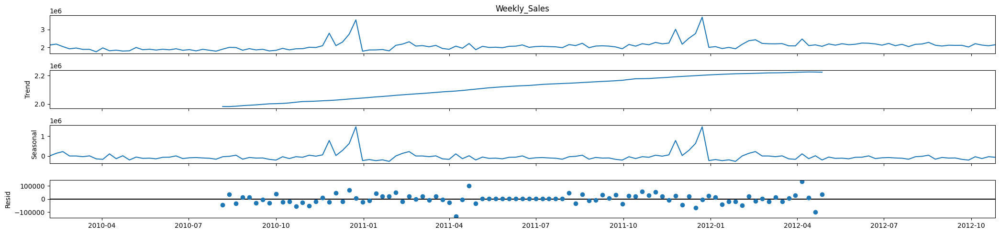



Seasonal Decomposition for Overall sales per week for store number5


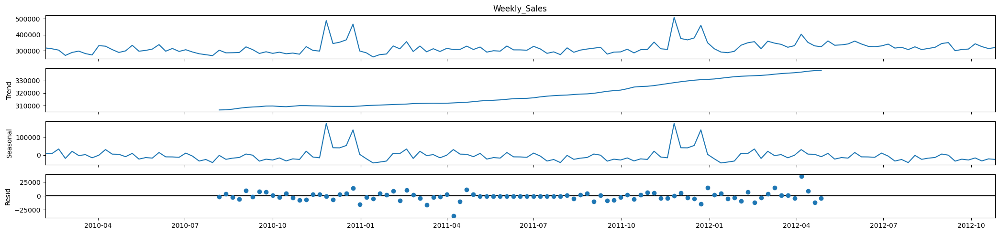



Seasonal Decomposition for Overall sales per week for store number6


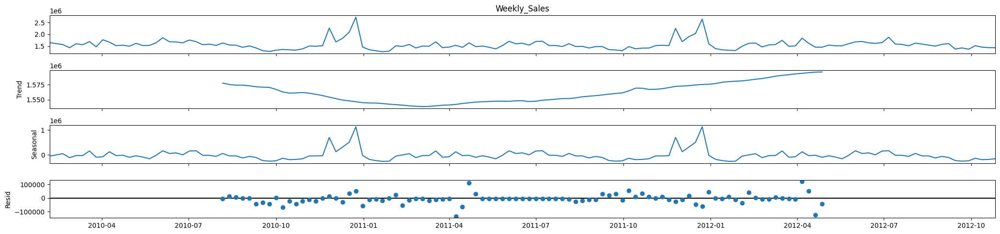



Seasonal Decomposition for Overall sales per week for store number7


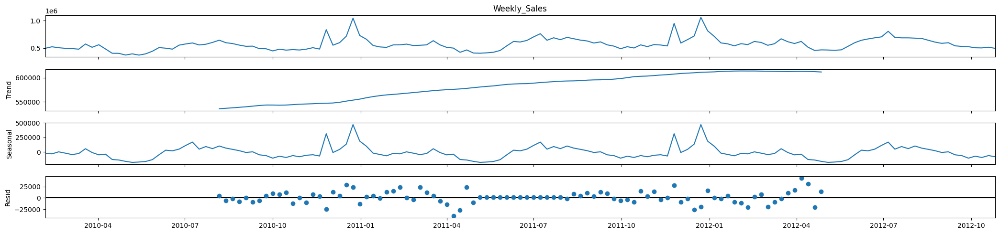



Seasonal Decomposition for Overall sales per week for store number8


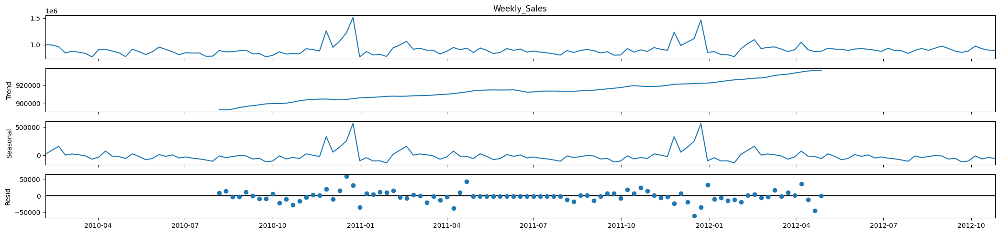



Seasonal Decomposition for Overall sales per week for store number9


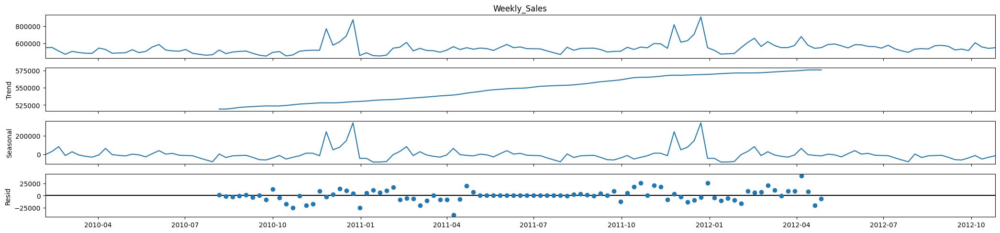



Seasonal Decomposition for Overall sales per week for store number10


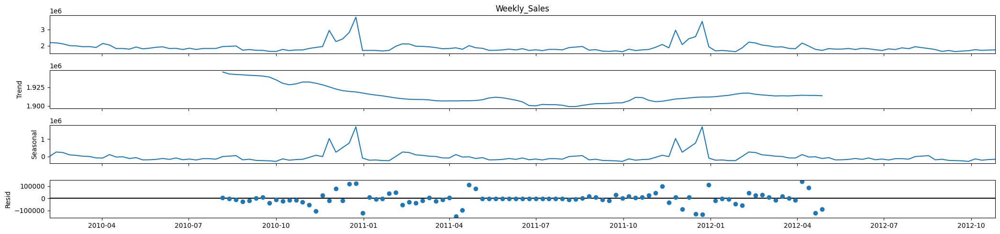



Seasonal Decomposition for Overall sales per week for store number11


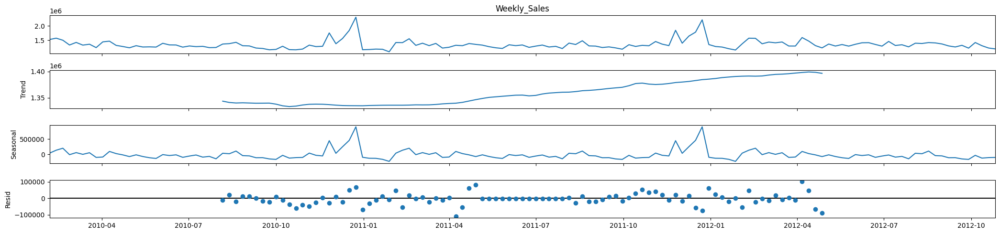



Seasonal Decomposition for Overall sales per week for store number12


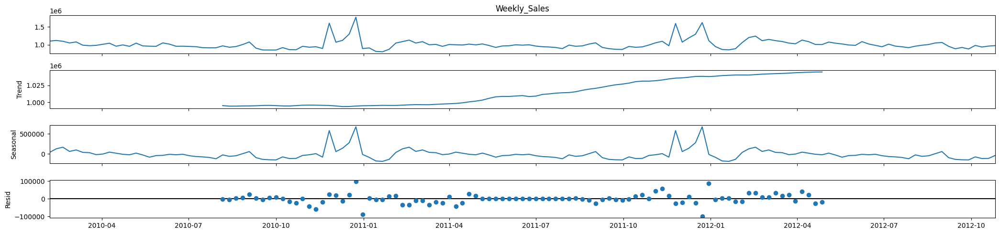



Seasonal Decomposition for Overall sales per week for store number13


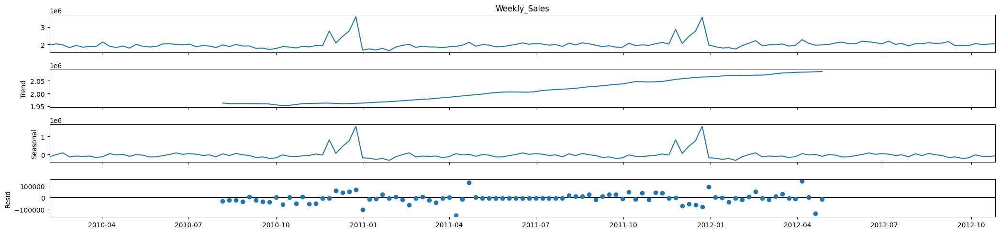



Seasonal Decomposition for Overall sales per week for store number14


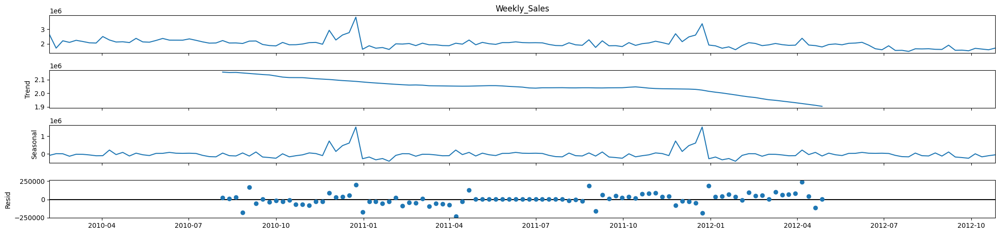



Seasonal Decomposition for Overall sales per week for store number15


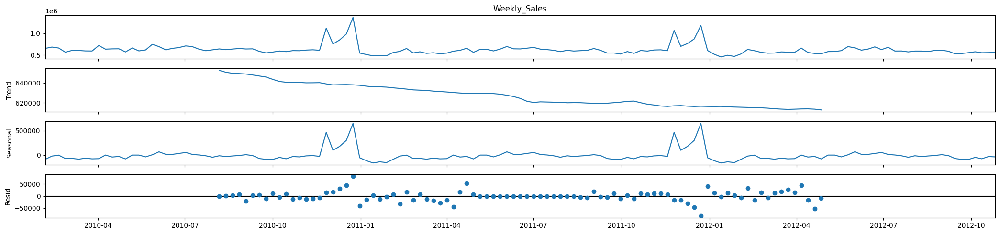



Seasonal Decomposition for Overall sales per week for store number16


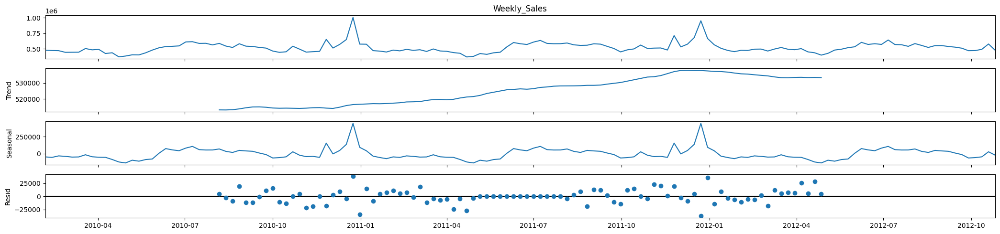



Seasonal Decomposition for Overall sales per week for store number17


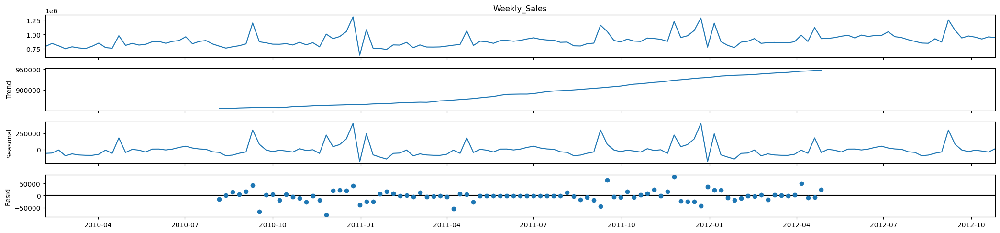



Seasonal Decomposition for Overall sales per week for store number18


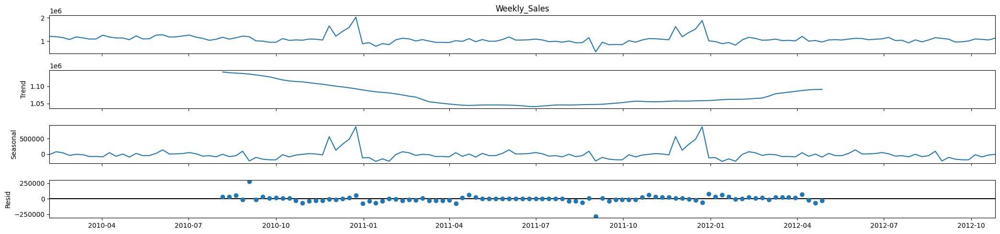



Seasonal Decomposition for Overall sales per week for store number19


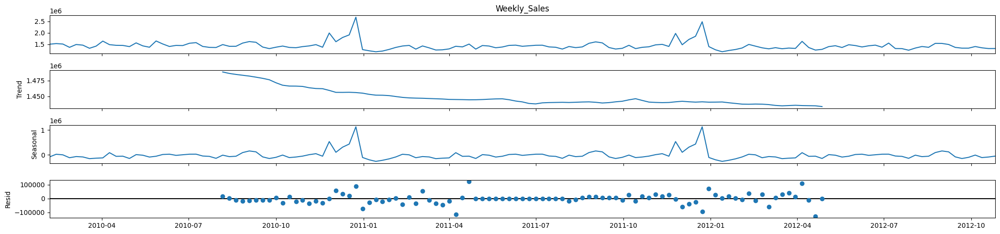



Seasonal Decomposition for Overall sales per week for store number20


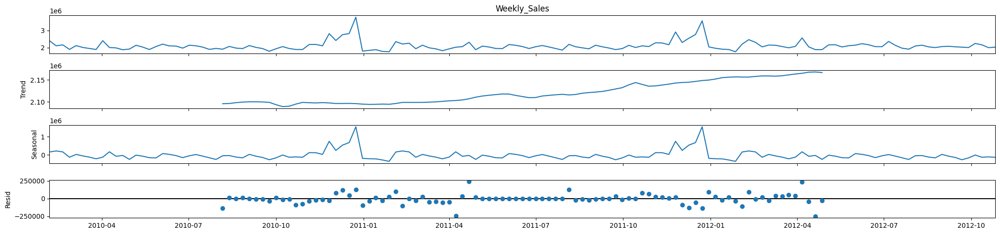



Seasonal Decomposition for Overall sales per week for store number21


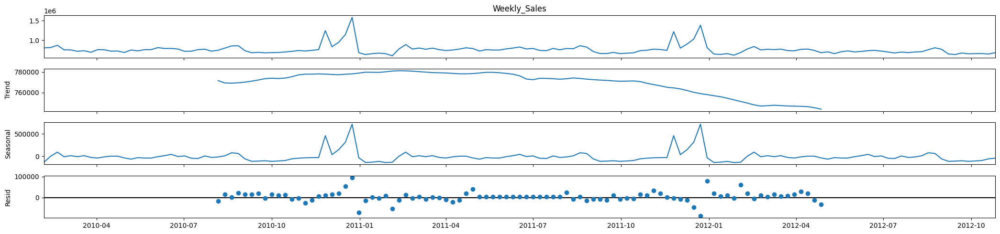



Seasonal Decomposition for Overall sales per week for store number22


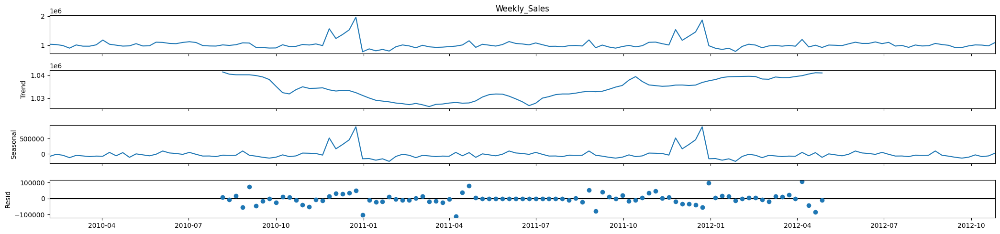



Seasonal Decomposition for Overall sales per week for store number23


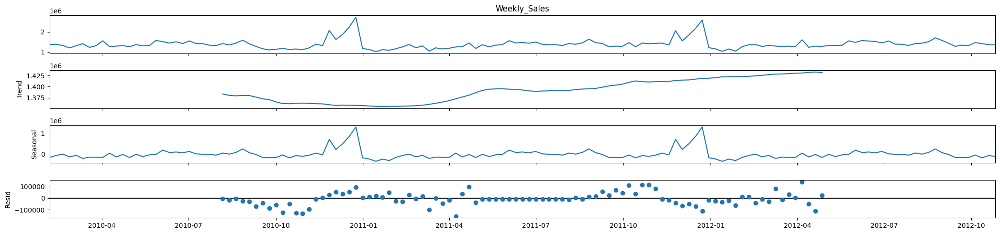



Seasonal Decomposition for Overall sales per week for store number24


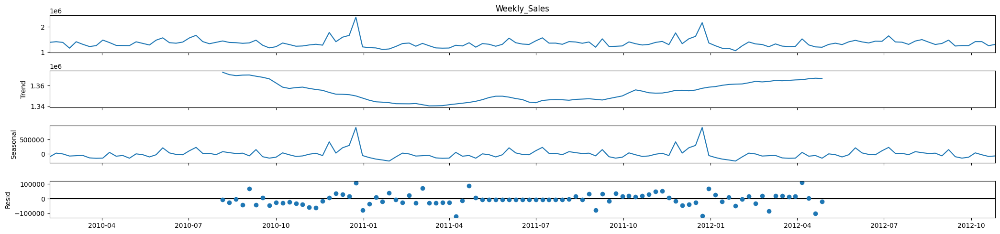



Seasonal Decomposition for Overall sales per week for store number25


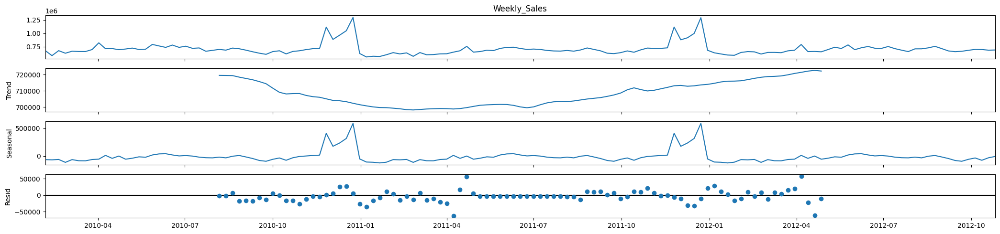



Seasonal Decomposition for Overall sales per week for store number26


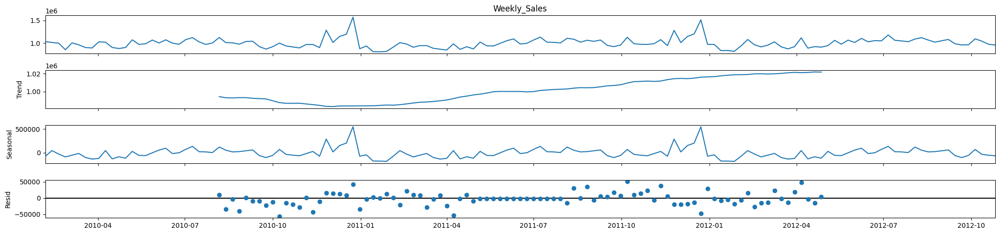



Seasonal Decomposition for Overall sales per week for store number27


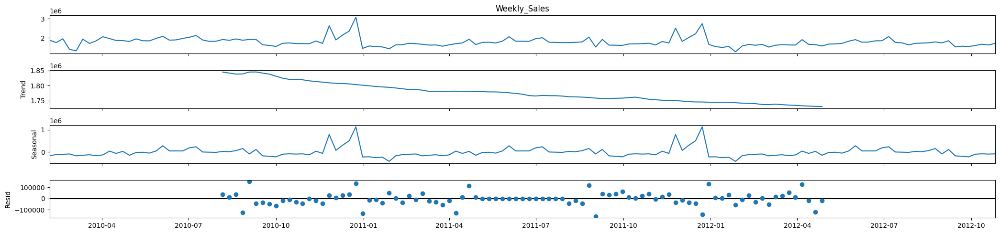



Seasonal Decomposition for Overall sales per week for store number28


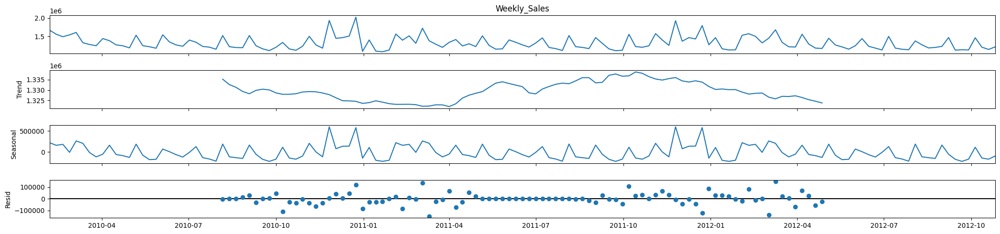



Seasonal Decomposition for Overall sales per week for store number29


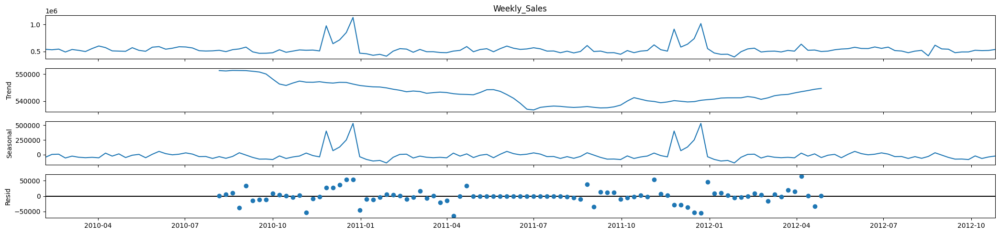



Seasonal Decomposition for Overall sales per week for store number30


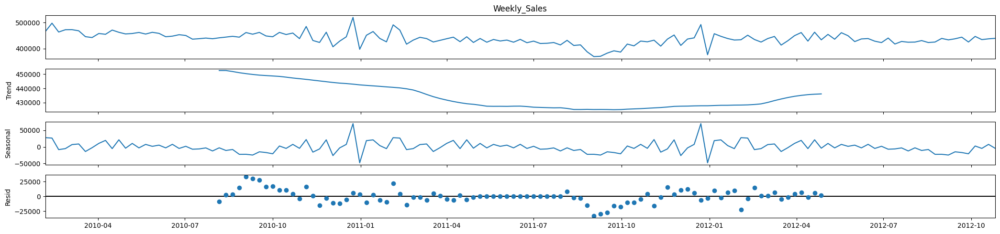



Seasonal Decomposition for Overall sales per week for store number31


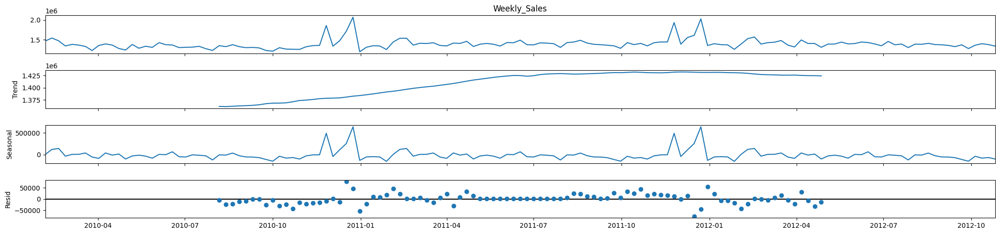



Seasonal Decomposition for Overall sales per week for store number32


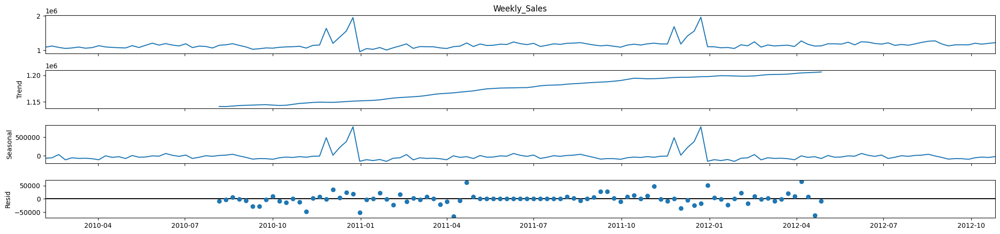



Seasonal Decomposition for Overall sales per week for store number33


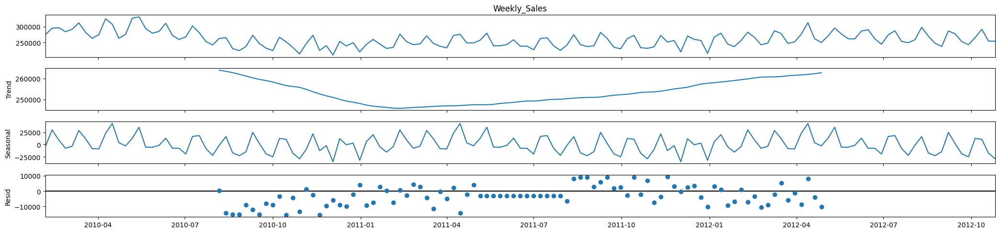



Seasonal Decomposition for Overall sales per week for store number34


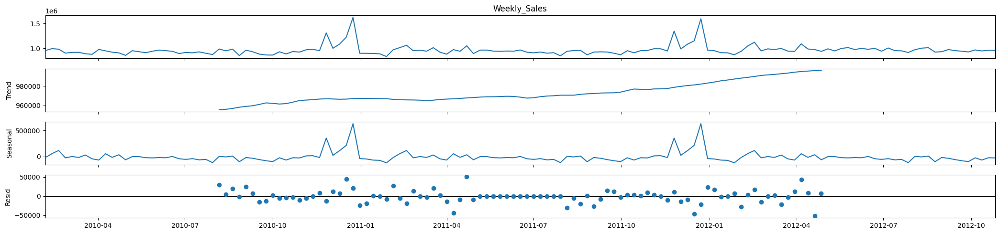



Seasonal Decomposition for Overall sales per week for store number35


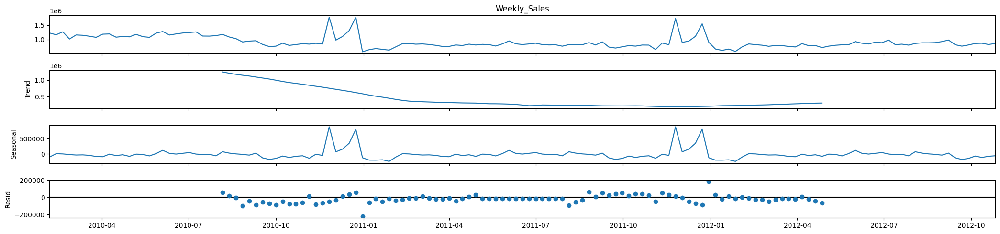



Seasonal Decomposition for Overall sales per week for store number36


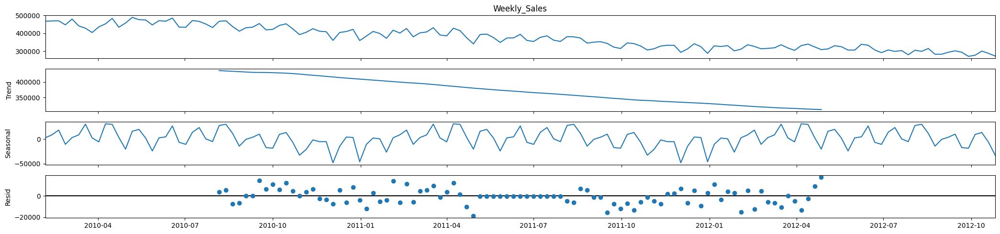



Seasonal Decomposition for Overall sales per week for store number37


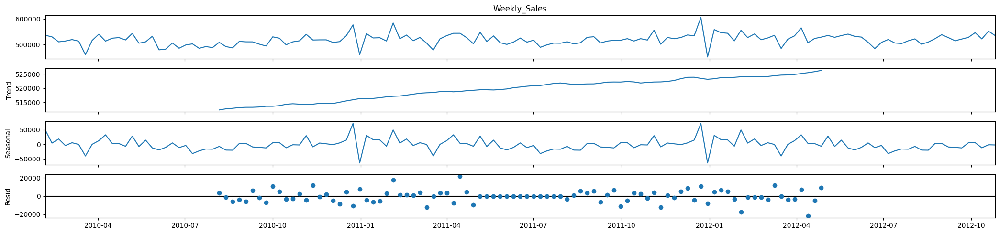



Seasonal Decomposition for Overall sales per week for store number38


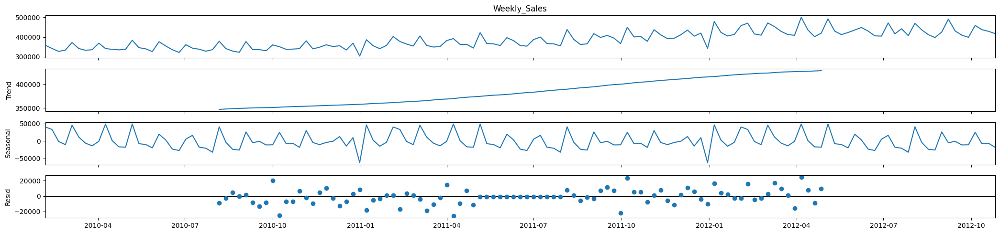



Seasonal Decomposition for Overall sales per week for store number39


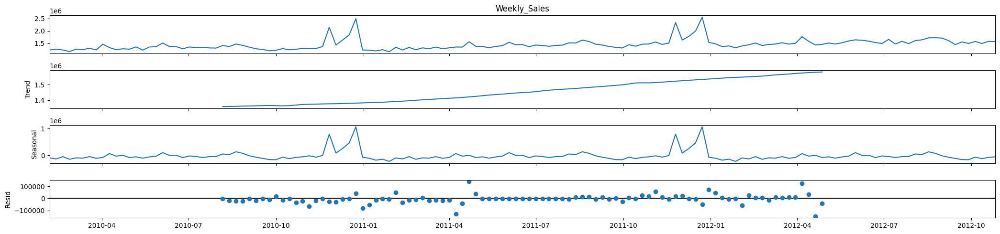



Seasonal Decomposition for Overall sales per week for store number40


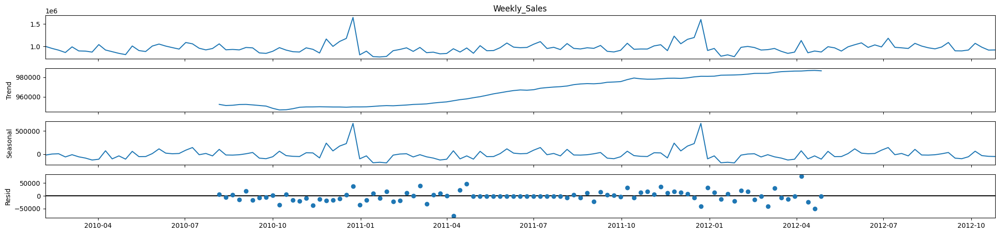



Seasonal Decomposition for Overall sales per week for store number41


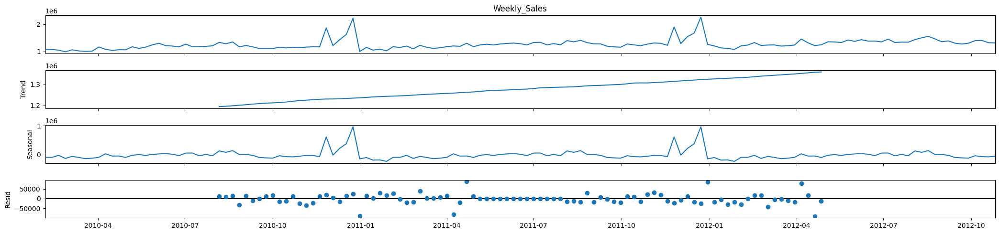



Seasonal Decomposition for Overall sales per week for store number42


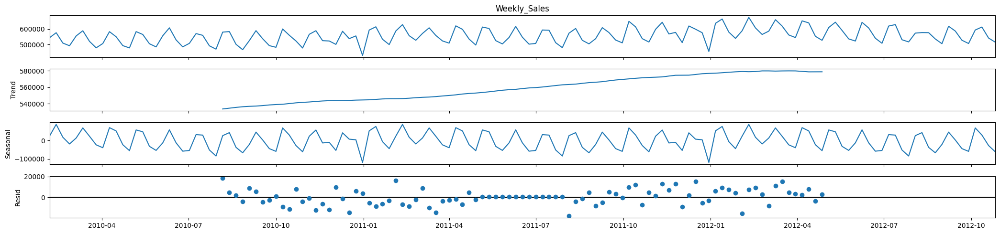



Seasonal Decomposition for Overall sales per week for store number43


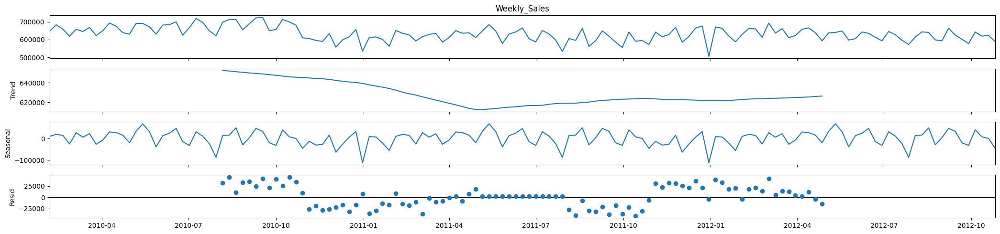



Seasonal Decomposition for Overall sales per week for store number44


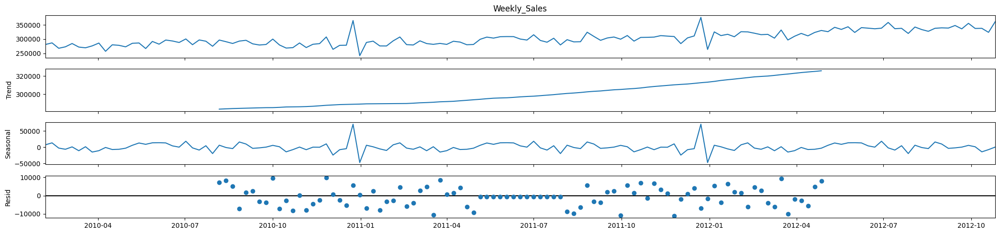



Seasonal Decomposition for Overall sales per week for store number45


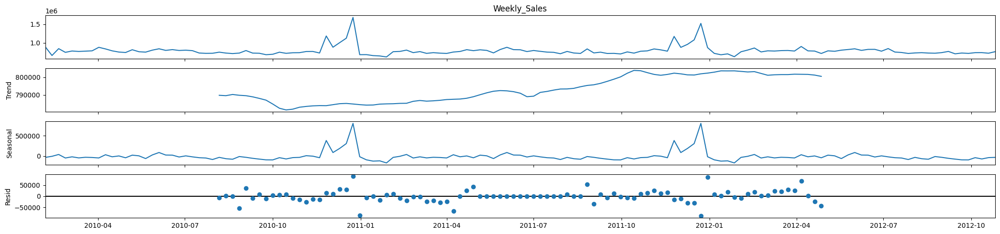

In [ ]:
for i in range(1,46):
  df1=data[data['Store']==i]
  df1=pd.DataFrame(df1.groupby('Date')['Weekly_Sales'].sum().reset_index())
  df2=df1.copy()
  df2.columns=['ds','y']
  df2['ds']=pd.to_datetime(df2['ds'],dayfirst=True)
  df2= df2.sort_values(by='ds')
  fig=px.line(df2, x="ds", y="y", title=f"Curve for Sum of Overall sales per week for store number{i}")
  fig.show()


  print('')
  print('')
  print(f"Seasonal Decomposition for Overall sales per week for store number{i}")
  df1['Date']=pd.to_datetime(df1['Date'],dayfirst=True)
  df1= df1.sort_values(by='Date')
  df1= df1.set_index(['Date'])
  from statsmodels.tsa.seasonal import seasonal_decompose
  decompose_result = seasonal_decompose(df1['Weekly_Sales'].dropna())
  decompose_result.plot();
  plt.show()

# PREDICTION FOR NEXT 12 WEEKS FOR STORE NUMBER 1.

In [ ]:
! pip install prophet
from prophet import Prophet

In [ ]:
df1= data[data['Store']==1][["Date",'Weekly_Sales']]

#Renaming the columns.
df1.columns=['ds','y']

#Changing the datatype of ds column to datetime.
df1['ds']= pd.to_datetime(df1['ds'],dayfirst=True)

In [ ]:
m = Prophet(
    seasonality_prior_scale=50,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.10,
    yearly_seasonality=25,
    growth='linear',
    interval_width=0.95,
    )
m.add_country_holidays(country_name='US')
m.fit(df1)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/upqcefpf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/3w1eoowl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97814', 'data', 'file=/tmp/tmpngad8_xd/upqcefpf.json', 'init=/tmp/tmpngad8_xd/3w1eoowl.json', 'output', 'file=/tmp/tmpngad8_xd/prophet_modeliuw0fct_/prophet_model-20231020155525.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:55:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:55:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
future=m.make_future_dataframe(periods=12,freq='W')

In [ ]:
forecast= m.predict(future)

In [ ]:
f1=forecast[['ds','yhat_lower','yhat_upper','yhat']]

In [ ]:
#Forecasted Values for 12 weeks.

forecasted_values= f1.tail(12)[['ds','yhat']]
forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
forecasted_values

,ds,yhat
143,2012-10-28,1461949
144,2012-11-04,1735351
145,2012-11-11,1587204
146,2012-11-18,1634383
147,2012-11-25,2016961
148,2012-12-02,1673309
149,2012-12-09,1772439
150,2012-12-16,1995124
151,2012-12-23,2198409
152,2012-12-30,1530800


In [ ]:
#representation of the values using graph.

from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

### MODEL EVALUATION AND TECHNIQUES.

In [ ]:
#predicted value.
predicted=f1.iloc[0:143]['yhat']

#Actual value.
actual= df1['y']

#Scoring.
from sklearn.metrics import r2_score , mean_absolute_error

#R2_score of the model.
print('R2_score of model is',r2_score(actual, predicted))

#Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
print(f'Mean Absolute Percentage Error (MAPE) {mape}')

#Mean absolute Error.
print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')

R2_score of model is 0.9322135228928632
Mean Absolute Percentage Error (MAPE) 2.025996891038544
Mean Absolute error is 31545.37844778923


# PREDICTION FOR NEXT 12 WEEKS FOR STORE NUMBER 11.

In [ ]:
df1= data[data['Store']==11][["Date",'Weekly_Sales']]

#Renaming the columns.
df1.columns=['ds','y']

#Changing the datatype of ds column to datetime.
df1['ds']= pd.to_datetime(df1['ds'],dayfirst=True)

#Calling model
m = Prophet(
    seasonality_prior_scale=50,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.10,
    yearly_seasonality=25,
    growth='linear',
    interval_width=0.95,
    )

m.add_country_holidays(country_name='US')
m.fit(df1)

#Creating future dataframe
future=m.make_future_dataframe(periods=12,freq='W')

#Predicting.
forecast= m.predict(future)
f1=forecast[['ds','yhat_lower','yhat_upper','yhat']]

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/dapddwhx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/i249pt4u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38418', 'data', 'file=/tmp/tmpngad8_xd/dapddwhx.json', 'init=/tmp/tmpngad8_xd/i249pt4u.json', 'output', 'file=/tmp/tmpngad8_xd/prophet_model__dxlj_h/prophet_model-20231020155526.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:55:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:55:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
#Forecasted Values for 12 weeks.

forecasted_values= f1.tail(12)[['ds','yhat']]
forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
forecasted_values

,ds,yhat
143,2012-10-28,1245284
144,2012-11-04,1483526
145,2012-11-11,1335822
146,2012-11-18,1402524
147,2012-11-25,1811015
148,2012-12-02,1471634
149,2012-12-09,1623603
150,2012-12-16,1900814
151,2012-12-23,2134518
152,2012-12-30,1339534


In [ ]:
#representation of the values using graph.

from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

### MODEL EVALUATION AND TECHNIQUES.

In [ ]:
#predicted value.
predicted=f1.iloc[0:143]['yhat']

#Actual value.
actual= df1['y']

#Scoring.
from sklearn.metrics import r2_score , mean_absolute_error

#R2_score of the model.
print('R2_score of model is',r2_score(actual, predicted))

#Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
print(f'Mean Absolute Percentage Error (MAPE) {mape}')

#Mean absolute Error.
print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')

R2_score of model is 0.9443293624947406
Mean Absolute Percentage Error (MAPE) 2.201910260592712
Mean Absolute error is 29868.344433940856


# PREDICTION FOR SALES FOR NEXT 12 WEEKS FOR STORE NUMBER 21.

In [ ]:
df1= data[data['Store']==21][["Date",'Weekly_Sales']]

#Renaming the columns.
df1.columns=['ds','y']

#Changing the datatype of ds column to datetime.
df1['ds']= pd.to_datetime(df1['ds'],dayfirst=True)

#Calling model
m = Prophet(
    seasonality_prior_scale=50,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.10,
    yearly_seasonality=25,
    growth='linear',
    interval_width=0.95,
    )

m.add_country_holidays(country_name='US')
m.fit(df1)

#Creating future dataframe
future=m.make_future_dataframe(periods=12,freq='W')

#Predicting.
forecast= m.predict(future)
f1=forecast[['ds','yhat_lower','yhat_upper','yhat']]

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/ei33q96x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/3uy38y0q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27405', 'data', 'file=/tmp/tmpngad8_xd/ei33q96x.json', 'init=/tmp/tmpngad8_xd/3uy38y0q.json', 'output', 'file=/tmp/tmpngad8_xd/prophet_modelwegzgpo4/prophet_model-20231020155526.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:55:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:55:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
#Forecasted Values for 12 weeks.

forecasted_values= f1.tail(12)[['ds','yhat']]
forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
forecasted_values

,ds,yhat
143,2012-10-28,656785
144,2012-11-04,717360
145,2012-11-11,681340
146,2012-11-18,729989
147,2012-11-25,1149396
148,2012-12-02,779196
149,2012-12-09,844357
150,2012-12-16,1063095
151,2012-12-23,1282068
152,2012-12-30,731663


In [ ]:
#representation of the values using graph.

from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

In [ ]:
#predicted value.
predicted=f1.iloc[0:143]['yhat']

#Actual value.
actual= df1['y']

#Scoring.
from sklearn.metrics import r2_score , mean_absolute_error

#R2_score of the model.
print('R2_score of model is',r2_score(actual, predicted))

#Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
print(f'Mean Absolute Percentage Error (MAPE) {mape}')

#Mean absolute Error.
print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')

R2_score of model is 0.9493404875728786
Mean Absolute Percentage Error (MAPE) 3.0885150664852747
Mean Absolute error is 22990.603931329475


# PREDICTION FOR SALES FOR STORE NUMBER 31 FOR 12 WEEKS.

In [ ]:
df1= data[data['Store']==31][["Date",'Weekly_Sales']]

#Renaming the columns.
df1.columns=['ds','y']

#Changing the datatype of ds column to datetime.
df1['ds']= pd.to_datetime(df1['ds'],dayfirst=True)

#Calling model
m = Prophet(
    seasonality_prior_scale=50,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.10,
    yearly_seasonality=25,
    growth='linear',
    interval_width=0.95,
    )

m.add_country_holidays(country_name='US')
m.fit(df1)

#Creating future dataframe
future=m.make_future_dataframe(periods=12,freq='W')

#Predicting.
forecast= m.predict(future)
f1=forecast[['ds','yhat_lower','yhat_upper','yhat']]

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/rwjsmqvd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/c553et4f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33103', 'data', 'file=/tmp/tmpngad8_xd/rwjsmqvd.json', 'init=/tmp/tmpngad8_xd/c553et4f.json', 'output', 'file=/tmp/tmpngad8_xd/prophet_modelrpexlolm/prophet_model-20231020155527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:55:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:55:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
#Forecasted Values for 12 weeks.

forecasted_values= f1.tail(12)[['ds','yhat']]
forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
forecasted_values

,ds,yhat
143,2012-10-28,1291934
144,2012-11-04,1427430
145,2012-11-11,1390761
146,2012-11-18,1462923
147,2012-11-25,1873803
148,2012-12-02,1409512
149,2012-12-09,1500314
150,2012-12-16,1711573
151,2012-12-23,1940898
152,2012-12-30,1332463


In [ ]:
#representation of the values using graph.

from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

In [ ]:
#predicted value.
predicted=f1.iloc[0:143]['yhat']

#Actual value.
actual= df1['y']

#Scoring.
from sklearn.metrics import r2_score , mean_absolute_error

#R2_score of the model.
print('R2_score of model is',r2_score(actual, predicted))

#Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
print(f'Mean Absolute Percentage Error (MAPE) {mape}')

#Mean absolute Error.
print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')

R2_score of model is 0.9430203552792034
Mean Absolute Percentage Error (MAPE) 1.6746867314267753
Mean Absolute error is 23428.370889379305


# PREDICTION FOR SALES FOR STORE NUMBER 41 FOR  12 WEEKS.





In [ ]:
df1= data[data['Store']==41][["Date",'Weekly_Sales']]

#Renaming the columns.
df1.columns=['ds','y']

#Changing the datatype of ds column to datetime.
df1['ds']= pd.to_datetime(df1['ds'],dayfirst=True)

#Calling model
m = Prophet(
    seasonality_prior_scale=50,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.10,
    yearly_seasonality=25,
    growth='linear',
    interval_width=0.95,
    )

m.add_country_holidays(country_name='US')
m.fit(df1)

#Creating future dataframe
future=m.make_future_dataframe(periods=12,freq='W')

#Predicting.
forecast= m.predict(future)
f1=forecast[['ds','yhat_lower','yhat_upper','yhat']]

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/e85h1i7m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/mbostejz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22234', 'data', 'file=/tmp/tmpngad8_xd/e85h1i7m.json', 'init=/tmp/tmpngad8_xd/mbostejz.json', 'output', 'file=/tmp/tmpngad8_xd/prophet_modelpm44my1g/prophet_model-20231020155527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:55:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:55:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
#Forecasted Values for 12 weeks.

forecasted_values= f1.tail(12)[['ds','yhat']]
forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
forecasted_values

,ds,yhat
143,2012-10-28,1298149
144,2012-11-04,1430838
145,2012-11-11,1350320
146,2012-11-18,1406578
147,2012-11-25,1977139
148,2012-12-02,1447610
149,2012-12-09,1594319
150,2012-12-16,1856561
151,2012-12-23,2243916
152,2012-12-30,1351472


In [ ]:
#representation of the values using graph.

from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

In [ ]:
#predicted value.
predicted=f1.iloc[0:143]['yhat']

#Actual value.
actual= df1['y']

#Scoring.
from sklearn.metrics import r2_score , mean_absolute_error

#R2_score of the model.
print('R2_score of model is',r2_score(actual, predicted))

#Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
print(f'Mean Absolute Percentage Error (MAPE) {mape}')

#Mean absolute Error.
print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')

R2_score of model is 0.946783660541588
Mean Absolute Percentage Error (MAPE) 2.7370930068567048
Mean Absolute error is 34631.221470238794


# CREATING A FUNCTION FOR PREDICTING  SALES FOR ANY STORE.

In [ ]:
def predict_sales():
  a= int(input("Enter the sotre number[1,45] for which you want to predict the sales."))
  df1= data[data['Store']==a][["Date",'Weekly_Sales']]

  #Renaming the columns.
  df1.columns=['ds','y']

  #Changing the datatype of ds column to datetime.
  df1['ds']= pd.to_datetime(df1['ds'],dayfirst=True)

  #Calling model
  m = Prophet(
     seasonality_prior_scale=50,
     holidays_prior_scale=10.0,
     changepoint_prior_scale=0.10,
     yearly_seasonality=25,
     growth='linear',
     interval_width=0.95 )

  m.add_country_holidays(country_name='US')
  m.fit(df1)

  #Creating future dataframe
  future=m.make_future_dataframe(periods=12,freq='W')

  #Predicting.
  forecast= m.predict(future)
  f1=forecast[['ds','yhat_lower','yhat_upper','yhat']]

  print('')
  print('')
  print('')
  print('Predicted Values')
  #Forecasted Values for 12 weeks.

  forecasted_values= f1.tail(12)[['ds','yhat']]
  forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
  print(forecasted_values)


  #predicted value.
  predicted=f1.iloc[0:143]['yhat']

  #Actual value.
  actual= df1['y']

  print('')
  print('')
  print('')
  print('Performance of the models')
  #Scoring.
  from sklearn.metrics import r2_score , mean_absolute_error

  #R2_score of the model.
  print('R2_score of model is',r2_score(actual, predicted))

  #Mean Absolute Percentage Error (MAPE)
  mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
  print(f'Mean Absolute Percentage Error (MAPE) {mape}')

  #Mean absolute Error.
  print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')


In [ ]:
predict_sales()

Enter the sotre number[1,45] for which you want to predict the sales.5


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/zajsawfl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpngad8_xd/bm6iofee.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1114', 'data', 'file=/tmp/tmpngad8_xd/zajsawfl.json', 'init=/tmp/tmpngad8_xd/bm6iofee.json', 'output', 'file=/tmp/tmpngad8_xd/prophet_modelmvv2bhkz/prophet_model-20231020155539.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:55:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:55:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing





Predicted Values
            ds    yhat
143 2012-10-28  310956
144 2012-11-04  371141
145 2012-11-11  311679
146 2012-11-18  336589
147 2012-11-25  515194
148 2012-12-02  387935
149 2012-12-09  377183
150 2012-12-16  404034
151 2012-12-23  457014
152 2012-12-30  357954
153 2013-01-06  316324
154 2013-01-13  301984



Performance of the models
R2_score of model is 0.9404900559827888
Mean Absolute Percentage Error (MAPE) 2.2564670788060956
Mean Absolute error is 7175.025995446109
